# Bismillah (May 2023)

Modelling menggunakan YOLOv5 yang .yaml (arsitektur) sudah dimodifikasi oleh ***Mavericks Team***

#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# clone Rickyfazaa - YOLOv5 repository
!git clone https://github.com/rickyfazaa/yolov5.git  # clone repo
# masuk kedalam YOLOv5 directories (folder)
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 9504, done.
remote: Total 9504 (delta 0), reused 0 (delta 0), pack-reused 9504
Receiving objects: 100% (9504/9504), 11.74 MiB | 17.75 MiB/s, done.
Resolving deltas: 100% (6354/6354), done.
/content/yolov5


# Install Dependencies yang ada di file requirements.txt

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 65.2 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# file common.py & yolo.py yang sudah ditambahkan vggLayer

In [ ]:
%cd models
# yolo.py
!gdown https://drive.google.com/uc?id=1J4SAiIFK48i1qGGlNF1AgcMM-hWXiehn
# common.py
!gdown https://drive.google.com/uc?id=1Febhs3WyxinICnbGSsBxioTEw7tc5E9B
%cd ..

/content/yolov5/models
Downloading...
From: https://drive.google.com/uc?id=1J4SAiIFK48i1qGGlNF1AgcMM-hWXiehn
To: /content/yolov5/models/yolo.py
100% 15.7k/15.7k [00:00<00:00, 75.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Febhs3WyxinICnbGSsBxioTEw7tc5E9B
To: /content/yolov5/models/common.py
100% 36.4k/36.4k [00:00<00:00, 126MB/s]
/content/yolov5


# Buat File ZIP

In [ ]:
!zip -r /content/yolov5.zip /content/yolov5

  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/data/ (stored 0%)
  adding: content/yolov5/data/coco128.yaml (deflated 50%)
  adding: content/yolov5/data/scripts/ (stored 0%)
  adding: content/yolov5/data/scripts/download_weights.sh (deflated 37%)
  adding: content/yolov5/data/scripts/get_coco.sh (deflated 47%)
  adding: content/yolov5/data/scripts/get_coco128.sh (deflated 36%)
  adding: content/yolov5/data/coco.yaml (deflated 52%)
  adding: content/yolov5/data/VOC.yaml (deflated 56%)
  adding: content/yolov5/data/SKU-110K.yaml (deflated 52%)
  adding: content/yolov5/data/Argoverse.yaml (deflated 56%)
  adding: content/yolov5/data/images/ (stored 0%)
  adding: content/yolov5/data/images/bus.jpg (deflated 1%)
  adding: content/yolov5/data/images/zidane.jpg (deflated 0%)
  adding: content/yolov5/data/hyps/ (stored 0%)
  adding: content/yolov5/data/hyps/hyp.Objects365.yaml (deflated 40%)
  adding: content/yolov5/data/hyps/hyp.scratch-high.yaml (deflated 53%)
  adding: conte

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5.zip /content/gdrive/MyDrive

# Bagaimana cara Maverics Preprocessing dataset sekunder dari roboflow?



1.   Kami mendownload Dataset https://universe.roboflow.com/roboflow-100/construction-safety-gsnvb
2.   Dataset tersebut kami download dengan format Pascal VOC
3.   Dataset tersebut kami preprocessing ukuran image dan anotasi labelnya ke dalam 256x256 menggunakan https://github.com/italojs/resize_dataset_pascalvoc
4.   Setelah itu, Dataset tersebut kami ubah kedalam format Yolo TXT menggunakan https://gist.github.com/Amir22010/a99f18ca19112bc7db0872a36a03a1ec
5.   Lalu kami menghapus anotasi label XML dan merapihkan folder sesuai seperti contoh dibawah,

# Contoh Structure Folder yang telah kami sesuaikan
 📦data256-yolo-no-helmet-vest.zip<br>
 ┣ 📂test<br>
 ┃ ┣ 📂images<br>
 ┃ ┗ 📂labels<br>
 ┣ 📂train<br>
 ┃ ┣ 📂images<br>
 ┃ ┗ 📂labels<br>
 ┣ 📂valid<br>
 ┃ ┣ 📂images<br>
 ┃ ┗ 📂labels<br>
 ┗ 📜data.yaml<br>



# Load Team Mavericks PPE Dataset

## Roboflow Version (tidak dipakai)

In [ ]:
# #follow the link below to get your download code from from Roboflow
# !pip install -q roboflow
# from roboflow import Roboflow
# rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")


!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="b9RYTjOZ18oGBnkpZ5xh")
project = rf.workspace("roboflow-100").project("construction-safety-gsnvb")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.3 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=a517dce0417e2807245ed24fc963f13676b33672eadf9713b3fe4da4fbb79957
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
    

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to construction-safety-2 in yolov5pytorch:: 100%|██████████| 2424/2424 [00:00<00:00, 4375.84it/s]


## Versi GoogleDrive Dataset

In [ ]:
# Link yolo train 1000 image : https://drive.google.com/file/d/1VT4b9nA5f36SSAylcv_CZcIblT9IH00x/view?usp=share_link
# https://drive.google.com/file/d/1OAU7ruLtsiMQE1krPRIRhYwcEkQdMLfD/view?usp=share_link
# !gdown https://drive.google.com/uc?id=1OAU7ruLtsiMQE1krPRIRhYwcEkQdMLfD
!gdown https://drive.google.com/uc?id=1VT4b9nA5f36SSAylcv_CZcIblT9IH00x

Downloading...
From: https://drive.google.com/uc?id=1VT4b9nA5f36SSAylcv_CZcIblT9IH00x
To: /content/yolov5/data-256-yolo-mavericks.zip
100% 45.4M/45.4M [00:00<00:00, 197MB/s]


In [ ]:
import os
import zipfile
local_zip = '/content/yolov5/data-256-yolo-mavericks.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content/yolov5')
zip_ref.close()

In [ ]:
!rm -rf data-256-yolo-mavericks.zip

In [ ]:
%cd /content/yolov5
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
dataset = '/content/yolov5/data-256-yolo-mavericks'
%cat {dataset}/data.yaml

/content/yolov5
names:
- helmet
- no-helmet
- no-vest
- person
- vest
nc: 5
train: data-256-yolo-mavericks/train/images
val: data-256-yolo-mavericks/valid/images


## Versi Github Dataset

In [ ]:
!git clone https://github.com/rickyfazaa/construction-safety-dataset.git

Cloning into 'construction-safety-dataset'...
remote: Enumerating objects: 2458, done.
remote: Counting objects: 100% (39/39), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 2458 (delta 16), reused 32 (delta 12), pack-reused 2419
Receiving objects: 100% (2458/2458), 125.64 MiB | 12.13 MiB/s, done.
Resolving deltas: 100% (1218/1218), done.


In [ ]:
import os
import zipfile
local_zip = '/content/yolov5/construction-safety-dataset/data-256-yolo-mavericks.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content/yolov5')
zip_ref.close()
!rm -rf construction-safety-dataset

# Check Dataset yaml (classes)

In [ ]:
%cd /content/yolov5
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
dataset = '/content/yolov5/data-256-yolo-mavericks'
%cat {dataset}/data.yaml

/content/yolov5
names:
- helmet
- no-helmet
- no-vest
- person
- vest
nc: 5
train: data-256-yolo-mavericks/train/images
val: data-256-yolo-mavericks/valid/images


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

# Check num_classes
print(f"{num_classes = }")

num_classes = '5'


In [ ]:
#this is the model configuration we will use for our tutorial
# Ini adlaah yaml Asli
%cat /content/yolov5/models/yolov5s.yaml # bukan yang custom

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

### Arsitektur Change 1

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

### Arsitektur Change 1 (vggLayer & BottleneckCSP)

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, vggLayer, [64, 2]],   # 0 P1/2
   [-1, 1, vggLayer, [128, 2]],  # 1 P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 2, vggLayer, [256, 2]],  # 2 P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 2, vggLayer, [512, 2]],  # 3 P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 2, vggLayer, [512, 2]],  # 4 P5/32
    [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

### Arsitektur Change 2

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

### Arsitektur Change 3

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml
# https://towardsdatascience.com/how-to-train-a-custom-object-detection-model-with-yolo-v5-917e9ce13208
# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33
width_multiple: 0.50
anchors:
  - [10,13, 16,30, 33,23]
  - [30,61, 62,45, 59,119]
  - [116,90, 156,198, 373,326]
backbone:
  [[-1, 1, Focus, [64, 3]],
   [-1, 1, Conv, [128, 3, 2]],
   [-1, 3, Bottleneck, [128]],
   [-1, 1, Conv, [256, 3, 2]],
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 6, BottleneckCSP, [1024]],
  ]
head:
  [[-1, 3, BottleneckCSP, [1024, False]],
   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],
   [-2, 1, nn.Upsample, [None, 2, "nearest"]],
   [[-1, 6], 1, Concat, [1]],
   [-1, 1, Conv, [512, 1, 1]],
   [-1, 3, BottleneckCSP, [512, False]],
   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],
   [-2, 1, nn.Upsample, [None, 2, "nearest"]],
   [[-1, 4], 1, Concat, [1]],
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 3, BottleneckCSP, [256, False]],
   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],
[[], 1, Detect, [nc, anchors]],
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 256 --batch 64 --epochs 300 --data {dataset}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2023-05-31 02:30:59.044282: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-31 02:31:00.056135: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/data-256-yolo-mavericks/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=64, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0],

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
!kill 5846

/bin/bash: line 0: kill: (5846) - No such process


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir runs


<IPython.core.display.Javascript object>

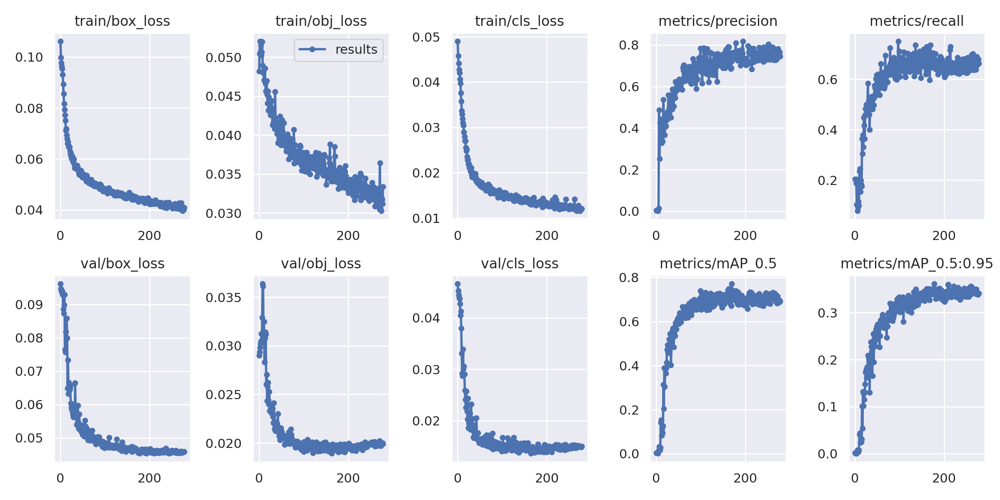

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


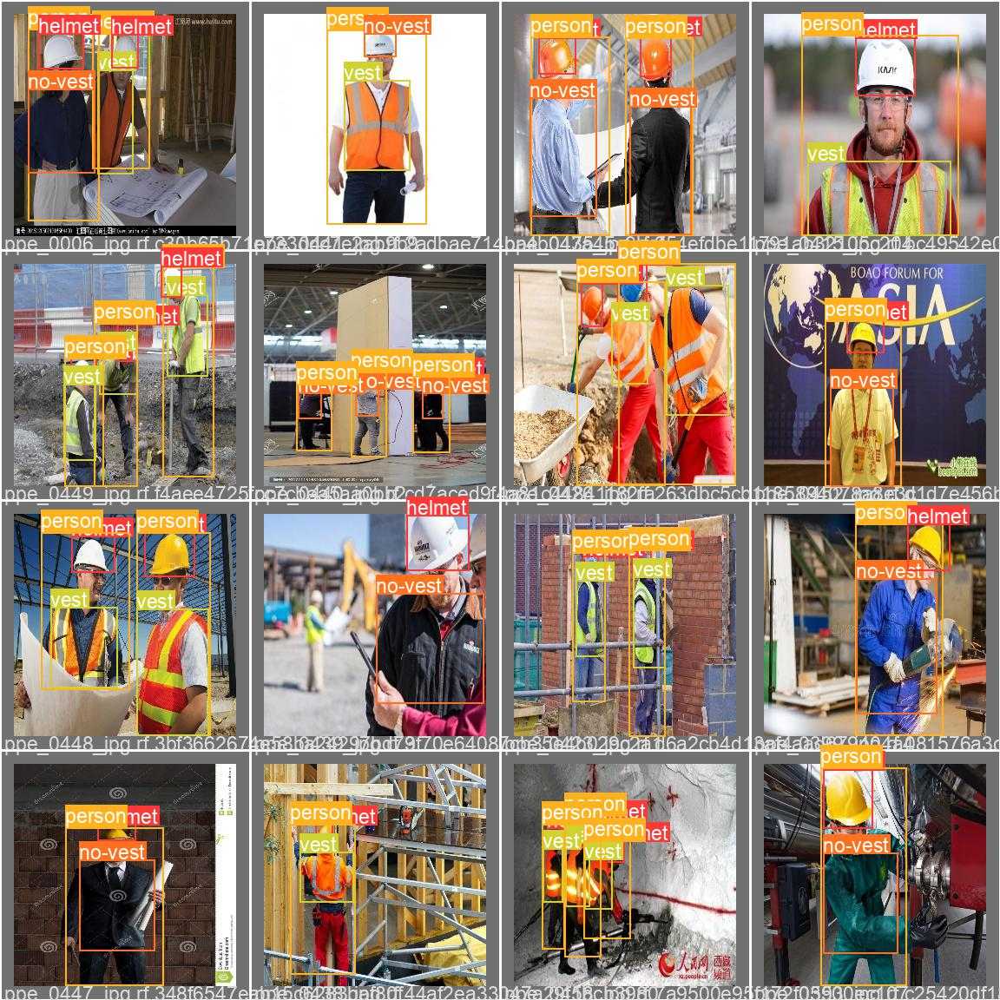

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


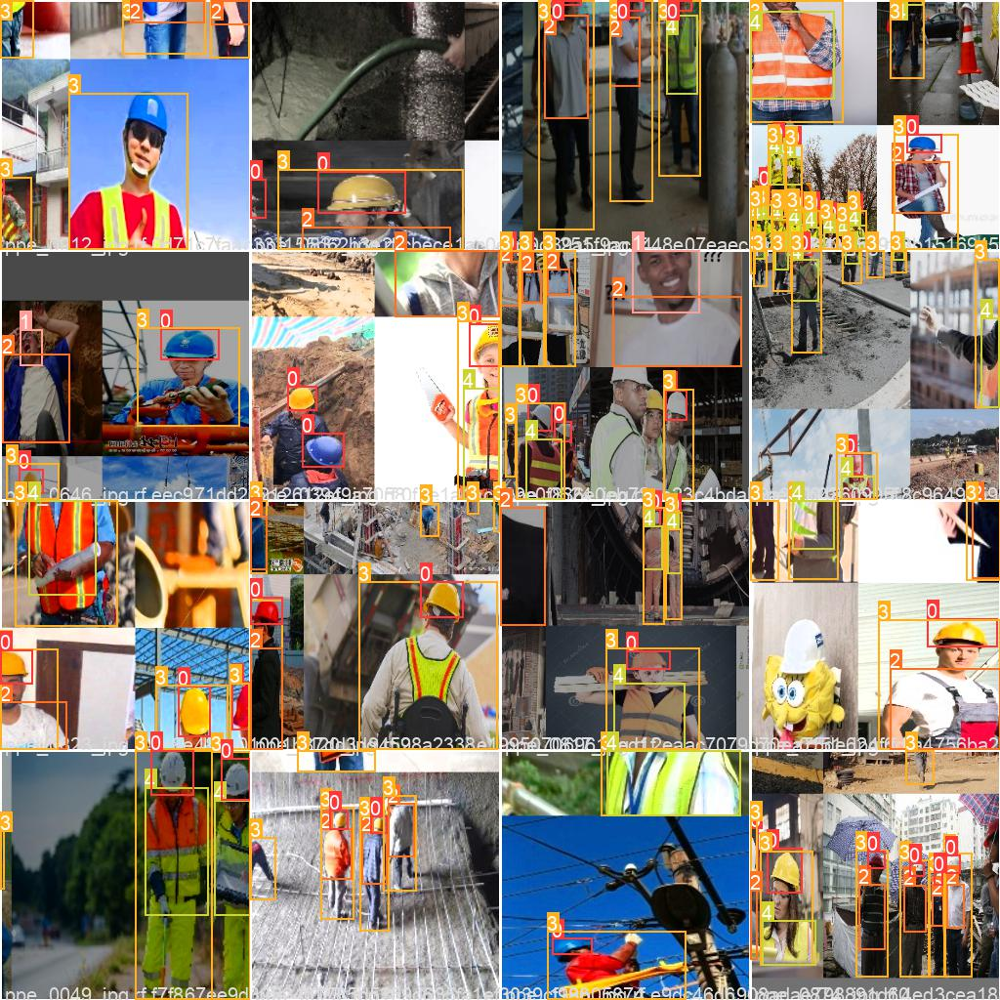

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 256 --conf 0.4 --source '/content/yolov5/data-256-yolo-mavericks/test/images'

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/data-256-yolo-mavericks/test/images, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 392e1f4 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7257306 parameters, 0 gradients, 16.8 GFLOPs
image 1/90 /content/yolov5/data-256-yolo-mavericks/test/images/ppe_0000_jpg.rf.c102a9a7c8dec01565a8f95ff295974c.jpg: 256x256 1 helmet, 1 person, 1 vest, Done. (0.007s)
image 2/90 /content/yolov5/data-256-yolo-mavericks/test/images/ppe_0004_jpg.rf.c3265071237f64a4f0c3e1bf3048f923.jpg: 256x256 2 helmets

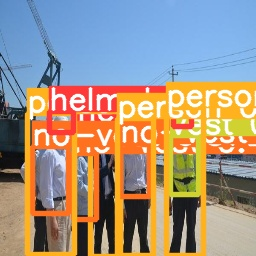

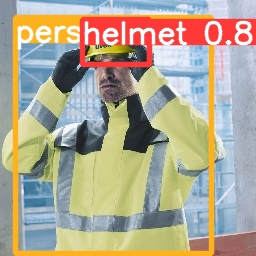

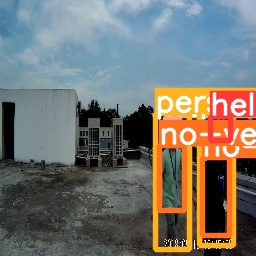

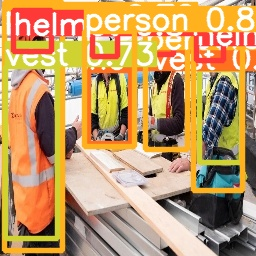

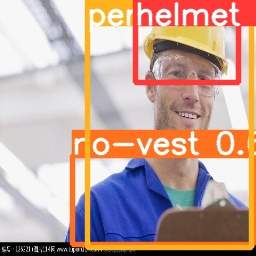

...

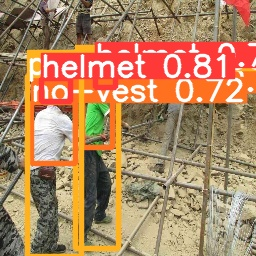

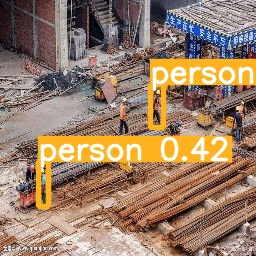

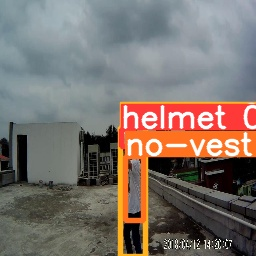

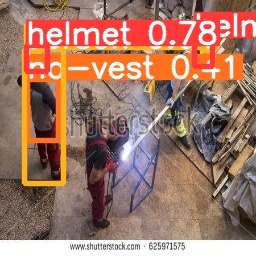

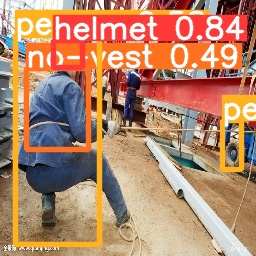

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/epoch-100-27-mei

# Export Trained Weights but Convert to pickle

In [ ]:
import pickle

In [ ]:
checkpoint = torch.load("/content/yolov5/runs/train/yolov5s_results/weights/best.pt")
with open("best.pkl", "wb") as outfile:
    pickle.dump(checkpoint, outfile)

In [ ]:
%cp /content/yolov5/best.pkl /content/gdrive/MyDrive

# Convert Model format .pt to .pkl

In [ ]:
checkpoint = torch.load("/content/yolov5/runs/train/yolov5s_results/weights/best.pt")
with open("best.pkl", "wb") as outfile:
    pickle.dump(checkpoint, outfile)

In [ ]:
# Open the file in binary mode
with open("/content/yolov5/best.pkl", 'rb') as file:
    # Call load method to deserialze
    model = pickle.load(file)

In [ ]:
model.eval()
torch.cuda.empty_cache()

AttributeError: ignored

# Deploy Model

In [ ]:
!pip install -q streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 107.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 kB 23.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 118.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00


In [ ]:
!pip install pyngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.2/681.2 kB 52.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-6.0.0-py3-none-any.whl size=19867 sha256=b962d08ffeb643c88a2ca0bac287463fca64fecd7ece2b5aa55fc9f42a8b5ded
  Stored in directory: /root/.cache/pip/wheels/5c/42/78/0c3d438d7f5730451a25f7ac6cbf4391759d22a67576ed7c2c
Successfully built pyngrok


# Streamlit kak aries

In [ ]:
%%writefile streamlit_app.py
import numpy as np
import pickle
import streamlit as st
import torch
import torchvision

from torchvision import datasets, models
from torchvision.transforms import functional as FT
from torchvision import transforms as T
from torch import nn, optim
from torch.nn import functional as F

from PIL import Image
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2 # our data augmentation library

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

from torchvision.utils import draw_bounding_boxes

classes = ['helmet',
 'no-helmet',
 'no-vest',
 'person',
 'vest']

@st.cache()
# Function for user input

def prediction_(ini_source):

  #test 1 images
  device = select_device(device)
  model = DetectMultiBackend(weights, device=device, dnn=dnn, data=data, fp16=half)
  stride, names, pt = model.stride, model.names, model.pt
  imgsz = check_img_size(imgsz, s=stride)  # check image size


uploaded_file = st.file_uploader("Choose a image file", type="jpg")

if uploaded_file is not None:
      # Convert the file to an opencv image.
  file_bytes = np.asarray(bytearray(uploaded_file.read()), dtype=np.uint8)
  opencv_image = cv2.imdecode(file_bytes, 1)

  #save input image
  image = Image.open(uploaded_file)
  img_array = np.array(image)
  cv2.imwrite('input.jpg', cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR))

val_transform = A.Compose([
  A.Resize(600, 600), # our input size can be 600px
  ToTensorV2()
  ])

#opencv_image = cv2.imdecode(file_bytes, 1)
image = cv2.imread('input.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image/255
image = val_transform(image=image)
#predict


# Now do something with the image! For example, let's display it:
print("original Image")
st.image(opencv_image, channels="BGR", caption='Original Image')

print("Predicted Image")
prediction_(image)

Overwriting streamlit_app.py


# Asli

In [ ]:
%%writefile streamlit_app.py
import numpy as np
import pickle
import streamlit as st
import torch
import torchvision

from torchvision import datasets, models
from torchvision.transforms import functional as FT
from torchvision import transforms as T
from torch import nn, optim
from torch.nn import functional as F

from PIL import Image
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2 # our data augmentation library

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

from torchvision.utils import draw_bounding_boxes

classes = ['helmet',
 'no-helmet',
 'no-vest',
 'person',
 'vest']

@st.cache()
# Function for user input

def prediction_(img):

  #test 1 images
  device = torch.device("cuda")
  img_int = torch.tensor(img['image']*255, dtype=torch.uint8)

  with torch.no_grad():
      prediction = model([img['image'].to(device, dtype=torch.float)])
      pred = prediction[0]

  fig = plt.figure(figsize=(28, 20))
  plt.imshow(draw_bounding_boxes(img_int,
    pred['boxes'][pred['scores'] > 0.8],
    [classes[i] for i in pred['labels'][pred['scores'] > 0.8].tolist()], width=4
      ).permute(1, 2, 0))
  fig.savefig('img_1.png')



uploaded_file = st.file_uploader("Choose a image file", type="jpg")

if uploaded_file is not None:
      # Convert the file to an opencv image.
  file_bytes = np.asarray(bytearray(uploaded_file.read()), dtype=np.uint8)
  opencv_image = cv2.imdecode(file_bytes, 1)

  #save input image
  image = Image.open(uploaded_file)
  img_array = np.array(image)
  cv2.imwrite('input.jpg', cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR))

val_transform = A.Compose([
  A.Resize(600, 600), # our input size can be 600px
  ToTensorV2()
  ])

#opencv_image = cv2.imdecode(file_bytes, 1)
image = cv2.imread('input.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image/255
image = val_transform(image=image)
#predict
prediction_(image)

# Now do something with the image! For example, let's display it:
print("original Image")
st.image(opencv_image, channels="BGR", caption='Original Image')

print("Predicted Image")
image = Image.open('img_1.png')
st.image(image, caption='Predicted Image')

Overwriting streamlit_app.py


# Check IP

In [ ]:
import requests

response = requests.get('https://ipv4.icanhazip.com')
public_ip = response.text.strip()

print("Public IP:", public_ip)


Public IP: 34.124.142.120


In [ ]:
!streamlit run streamlit_app.py & npx localtunnel --port 8501

[##................] / fetchMetadata: sill resolveWithNewModule ms@2.1.2 checki


  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://35.226.44.69:8501

npx: installed 22 in 1.971s
your url is: https://brown-gifts-judge.loca.lt
  Stopping...
^C


In [ ]:
!wget -q -O - ipv4.icanhazip.comwget -q -O - ipv4.icanhazip.com

35.240.169.98


# Contoh

In [ ]:
import os
import torch
from models.common import DetectMultiBackend # I assume you named your model as Model, change it accordingly

model = DetectMultiBackend()  # Then in here instantiate your model
model.load_state_dict(torch.load('/content/yolov5/runs/train/yolov5s_results/weights/best.pt'))  # Then load your model's weights.

In [ ]:
import numpy as np
import pickle
import streamlit as st
import torch
import torchvision

from torchvision import datasets, models
from torchvision.transforms import functional as FT
from torchvision import transforms as T
from torch import nn, optim
from torch.nn import functional as F

from PIL import Image
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2 # our data augmentation library

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

from torchvision.utils import draw_bounding_boxes

#Import modelnya
with open('/content/yolov5/best.pkl', 'rb') as file:
    model = pickle.load(file)
# model.eval()
# torch.cuda.empty_cache()

classes = ['helmet',
 'no-helmet',
 'no-vest',
 'person',
 'vest']

@st.cache()
# Function for user input

def prediction_(img):

  #test 1 images
  device = torch.device("cuda")
  img_int = torch.tensor(img['image']*255, dtype=torch.uint8)

  with torch.no_grad():
      prediction = model([img['image'].to(device, dtype=torch.float)])
      pred = prediction[0]

  fig = plt.figure(figsize=(28, 20))
  plt.imshow(draw_bounding_boxes(img_int,
    pred['boxes'][pred['scores'] > 0.8],
    [classes[i] for i in pred['labels'][pred['scores'] > 0.8].tolist()], width=4
      ).permute(1, 2, 0))
  fig.savefig('img_1.png')

In [ ]:
uploaded_file = st.file_uploader("Choose a image file", type="jpg")

2023-05-24 08:40:38.908 
  command:

    streamlit run /usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py [ARGUMENTS]


In [ ]:
if uploaded_file is not None:
      # Convert the file to an opencv image.
  file_bytes = np.asarray(bytearray(uploaded_file.read()), dtype=np.uint8)
  opencv_image = cv2.imdecode(file_bytes, 1)

  #save input image
  image = Image.open(uploaded_file)
  img_array = np.array(image)
  cv2.imwrite('input.jpg', cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR))

val_transform = A.Compose([
  A.Resize(600, 600), # our input size can be 600px
  ToTensorV2()
  ])

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)

# By YOLOv5 Streamlit

In [ ]:
cd

/root


In [ ]:
# !rm -rf yolov5-flask-object-detection

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
%%writefile req.txt
# YOLOv5 requirements
# Usage: pip install -r requirements.txt

# Base ----------------------------------------
matplotlib>=3.2.2
numpy>=1.18.5
opencv-python
Pillow>=7.1.2
PyYAML>=5.3.1
requests>=2.23.0
scipy>=1.4.1  # Google Colab version
torch>=1.7.0
torchvision>=0.8.1
tqdm>=4.41.0
protobuf<4.21.5  # https://github.com/ultralytics/yolov5/issues/8012
ultralytics
# Logging -------------------------------------
tensorboard>=2.4.1
# wandb

# Plotting ------------------------------------
pandas>=1.1.4
seaborn>=0.11.0


# Extras --------------------------------------
ipython  # interactive notebook
psutil  # system utilization
thop  # FLOPs computation
streamlit
wget
ffmpeg-python

Writing req.txt


In [ ]:
!pip install -r req.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.4/591.4 kB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 110.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 kB 20.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 108.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=c0400a6849071672a0b0b30a17362b4edf87e8e745c570f7d8c21314b2f067d0
  Stored in directory: /root/.c

In [ ]:
%%writefile video_predict.py
import os
import os.path as osp
import cv2
from PIL import Image
import streamlit as st


def runVideo(model, video, vdo_view, warn):
    video_name = osp.basename(video)
    outputpath = osp.join('data/video_output', video_name)

    # Create A Dir to save Video Frames
    os.makedirs('data/video_frames', exist_ok=True)
    frames_dir = osp.join('data/video_frames', video_name)
    os.makedirs(frames_dir, exist_ok=True)
    cap = cv2.VideoCapture(video)
    frame_count = 0
    with st.spinner(text="Predicting..."):
        warn.warning(
            'This is realtime prediction, If you wish to download the final prediction result wait until the process done.', icon="⚠️")
        while True:
            frame_count += 1
            ret, frame = cap.read()
            if ret == False:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            result = model(frame)
            result.render()
            image = Image.fromarray(result.ims[0])
            vdo_view.image(image, caption='Current Model Prediction(s)')
            image.save(osp.join(frames_dir, f'{frame_count}.jpg'))
        cap.release()
        # convert frames in dir to a single video file
        os.system(
            f'ffmpeg -framerate 30 -i {frames_dir}/%d.jpg -c:v libx264 -pix_fmt yuv420p {outputpath}')
    # Clean up Frames Dir
    os.system(f'rm -rf {frames_dir}')

    # Display Video
    output_video = open(outputpath, 'rb')
    output_video_bytes = output_video.read()
    st.video(output_video_bytes)
    st.write("Model Prediction")
    vdo_view.empty()
    warn.empty()


Writing video_predict.py


In [ ]:
%%writefile app.py
import streamlit as st
import torch
from PIL import Image
from io import *
import glob
from datetime import datetime
import os
import wget
from video_predict import runVideo


# Configurations
CFG_MODEL_PATH = "/content/yolov5/runs/train/yolov5s_results/weights/best.pt"
CFG_ENABLE_URL_DOWNLOAD = False
CFG_ENABLE_VIDEO_PREDICTION = False
if CFG_ENABLE_URL_DOWNLOAD:
    # Configure this if you set cfg_enable_url_download to True
    url = "https://drive.google.com/uc?id=1OAU7ruLtsiMQE1krPRIRhYwcEkQdMLfD"
# End of Configurations


def imageInput(model, src):

    if src == 'Upload your own data.':
        image_file = st.file_uploader(
            "Upload An Image", type=['png', 'jpeg', 'jpg'])
        col1, col2 = st.columns(2)
        if image_file is not None:
            img = Image.open(image_file)
            with col1:
                st.image(img, caption='Uploaded Image',
                         width=256) # use_column_width='always'
            ts = datetime.timestamp(datetime.now())
            imgpath = os.path.join('data/input', str(ts)+image_file.name)
            outputpath = os.path.join(
                'data/output', os.path.basename(imgpath))
            with open(imgpath, mode="wb") as f:
                f.write(image_file.getbuffer())

            with st.spinner(text="Predicting..."):
                # Load model
                pred = model(imgpath)
                pred.render()
                # save output to file
                for im in pred.imgs:
                    im_base64 = Image.fromarray(im)
                    im_base64.save(outputpath)

            # Predictions
            img_ = Image.open(outputpath)
            with col2:
                st.image(img_, caption='Model Prediction(s)',
                         width=256) # use_column_width='always'


def videoInput(model, src):
    if src == 'Upload your own data.':
        uploaded_video = st.file_uploader(
            "Upload A Video", type=['mp4', 'mpeg', 'mov'])
        pred_view = st.empty()
        warning = st.empty()
        if uploaded_video != None:

            # Save video to disk
            ts = datetime.timestamp(datetime.now())  # timestamp a upload
            uploaded_video_path = os.path.join(
                'data/uploads', str(ts)+uploaded_video.name)
            with open(uploaded_video_path, mode='wb') as f:
                f.write(uploaded_video.read())

            # Display uploaded video
            with open(uploaded_video_path, 'rb') as f:
                video_bytes = f.read()
            st.video(video_bytes)
            st.write("Uploaded Video")
            submit = st.button("Run Prediction")
            if submit:
                runVideo(model, uploaded_video_path, pred_view, warning)

    elif src == 'From example data.':
        # Image selector slider
        videopaths = glob.glob('data/example_videos/*')
        if len(videopaths) == 0:
            st.error(
                'No videos found, Please upload example videos in data/example_videos', icon="⚠️")
            return
        imgsel = st.slider('Select random video from example data.',
                           min_value=1, max_value=len(videopaths), step=1)
        pred_view = st.empty()
        video = videopaths[imgsel-1]
        submit = st.button("Predict!")
        if submit:
            runVideo(model, video, pred_view, warning)


def main():


    # -- Sidebar
    st.sidebar.title('⚙️ Options')
    datasrc = st.sidebar.radio("Select input source.", [
                               'Upload your own data.'])

    if CFG_ENABLE_VIDEO_PREDICTION:
        option = st.sidebar.radio("Select input type.", ['Image', 'Video'])
    else:
        option = st.sidebar.radio("Select input type.", ['Image'])
    if torch.cuda.is_available():
        deviceoption = st.sidebar.radio("Select compute Device.", [
                                        'cpu', 'cuda'], disabled=False, index=0)
    else:
        deviceoption = st.sidebar.radio("Select compute Device.", [
                                        'cpu', 'cuda'], disabled=True, index=0)
    # -- End of Sidebar

    st.header('📦 Penerapan Teknologi Object Detection dalam Identifikasi Pemakaian APD pada Pekerja Konstruksi - YOLOv5')
    st.sidebar.markdown(
        "Hi! We are Mavericks!")

    if option == "Image":
        imageInput(loadmodel(deviceoption), datasrc)
    elif option == "Video":
        videoInput(loadmodel(deviceoption), datasrc)


# Downlaod Model from url.
@st.cache_resource
def downloadModel():
    if not os.path.exists(CFG_MODEL_PATH):
        wget.download(url, out="models/")


@st.cache_resource
def loadmodel(device):
    model = torch.hub.load('rickyfazaa/yolov5', 'custom',
                           path=CFG_MODEL_PATH, force_reload=True, device=device)
    return model


if __name__ == '__main__':
    main()

Overwriting app.py


In [ ]:
!pip install pyngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.2/681.2 kB 42.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-6.0.0-py3-none-any.whl size=19867 sha256=6d1ef4041914f35da9d5a45aa3f2b1f0093f59211fa562c47daff037bcdfc57f
  Stored in directory: /root/.cache/pip/wheels/5c/42/78/0c3d438d7f5730451a25f7ac6cbf4391759d22a67576ed7c2c
Successfully built pyngrok


In [ ]:
import requests

response = requests.get('https://ipv4.icanhazip.com')
public_ip = response.text.strip()

print("Public IP:", public_ip)


Public IP: 34.87.80.111


In [ ]:
!streamlit run app.py & npx localtunnel --port 8501

[##................] / loadDep:strip-ansi: sill resolveWithNewModule ansi-regex


  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://34.87.80.111:8501

npx: installed 22 in 2.359s
your url is: https://rotten-bugs-sin.loca.lt
Downloading: "https://github.com/rickyfazaa/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-5-27 Python-3.10.11 torch-2.0.1+cu118 CPU

Fusing layers... 
custom_YOLOv5s summary: 241 layers, 2760682 parameters, 0 gradients, 29.7 GFLOPs
Adding AutoShape... 
